In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scvelo as scv

# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 2 
scv.settings.verbosity = 2

sc.logging.print_header()
scv.logging.print_version()

scv.settings.presenter_view = True  # set max width size for presenter view
# sc.settings.set_figure_params(dpi=80, facecolor='white')
scv.settings.set_figure_params('scvelo')  # for beautified visualization

# Make folders for storing figures and temporary results file
# Note that the convention of scanpy and scvelo is to put the figures inside the scripts folder,
# which is different from what I like (put figures out side of the scripts folder)
!mkdir figures
!mkdir write

scanpy==1.6.0 anndata==0.7.4 umap==0.4.6 numpy==1.19.1 scipy==1.5.2 pandas==1.1.3 scikit-learn==0.23.2 statsmodels==0.11.1 python-igraph==0.7.1 louvain==0.7.0 leidenalg==0.7.0
Running scvelo 0.2.2 (python 3.7.7) on 2021-01-04 10:40.
mkdir: figures: File exists
mkdir: write: File exists


## Read in 10x genomics data and basic filtering

In [2]:
adata = sc.read_10x_mtx(
    '../data/E13epi/',         # the directory with the `.mtx` file
    var_names='gene_symbols',  # use gene symbols for the variable names (variables-axis index)
    cache=True)                # write a cache file for faster subsequent reading

adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`
adata

... reading from cache file cache/..-data-E13epi-matrix.h5ad


AnnData object with n_obs × n_vars = 7688 × 48816
    var: 'gene_ids', 'feature_types'

In [3]:
# Basic filtering to discard cells express too few genes (<200)
# and genes expressed in too few cells (<3)

sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 2 cells that have less than 200 genes expressed
filtered out 27881 genes that are detected in less than 3 cells


## QC filtering: mitochondrial content, gene counts and rare cell types

In [4]:
## QC metrics annotation

# Annotate the group of mitochondrial genes as 'mt'
#
# Note: mitochondrial genes in human begins with 'MT-' whereas mouse with 'mt-'

adata.var['mt'] = adata.var_names.str.startswith('mt-')  
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None,
                           log1p=False, inplace=True)

# Annotate mesenchyme specific genes ['Col3a1', 'Mab21l2', 'Dcn'] as 'mes'
#
# This is to prepare a QC feature to filter out rare mesenchymal cells,
# which were likely attached to the surface of epithelium during isolation.
# These cells are very different from epithelial cells and will thus skew the
# analysis to highlight epithelial and mesenchymal differences. Therefore,
# we filter them out to focus on the data structure of the epithelial cells.

adata.var['mes'] = adata.var_names.isin(['Col3a1', 'Mab21l2', 'Dcn'])
sc.pp.calculate_qc_metrics(adata, qc_vars=['mes'], percent_top=None,
                           log1p=False, inplace=True)

# Annotate specific genes to exlore the correlations of their expression

genes = ['Cdh1', 'Snai2', 'Col4a1', 'Col4a2', 'Krt14']
for gene_of_interest in genes:
    adata.var[gene_of_interest] = adata.var_names.isin([gene_of_interest])
    sc.pp.calculate_qc_metrics(adata, qc_vars=[gene_of_interest], percent_top=None,
                               log1p=False, inplace=True)

adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_mes,pct_counts_mes,total_counts_Cdh1,pct_counts_Cdh1,total_counts_Snai2,pct_counts_Snai2,total_counts_Col4a1,pct_counts_Col4a1,total_counts_Col4a2,pct_counts_Col4a2,total_counts_Krt14,pct_counts_Krt14
AAACCTGAGCTAGTTC-1,3980,3979,15619.0,151.0,0.966771,0.0,0.000000,3.0,0.019207,0.0,0.000000,1.0,0.006402,2.0,0.012805,1.0,0.006402
AAACCTGCAACGATCT-1,3700,3697,14725.0,218.0,1.480475,2.0,0.013582,0.0,0.000000,4.0,0.027165,3.0,0.020374,1.0,0.006791,10.0,0.067912
AAACCTGCACCAGGTC-1,3501,3501,13237.0,207.0,1.563798,0.0,0.000000,2.0,0.015109,1.0,0.007555,0.0,0.000000,1.0,0.007555,0.0,0.000000
AAACCTGCACGAAGCA-1,4799,4799,25453.0,358.0,1.406514,0.0,0.000000,3.0,0.011786,0.0,0.000000,0.0,0.000000,1.0,0.003929,2.0,0.007858
AAACCTGCAGCTGCTG-1,4381,4380,18272.0,240.0,1.313485,0.0,0.000000,1.0,0.005473,0.0,0.000000,2.0,0.010946,1.0,0.005473,1.0,0.005473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCAGGTAAA-1,6085,6083,38594.0,655.0,1.697155,0.0,0.000000,5.0,0.012955,0.0,0.000000,2.0,0.005182,0.0,0.000000,1.0,0.002591
TTTGTCATCCCTTGCA-1,5533,5532,29497.0,326.0,1.105197,0.0,0.000000,3.0,0.010171,1.0,0.003390,2.0,0.006780,0.0,0.000000,4.0,0.013561
TTTGTCATCGCGTTTC-1,4207,4206,18827.0,223.0,1.184469,0.0,0.000000,0.0,0.000000,1.0,0.005312,2.0,0.010623,1.0,0.005312,12.0,0.063738
TTTGTCATCTAACTCT-1,4169,4169,17098.0,205.0,1.198971,0.0,0.000000,1.0,0.005849,1.0,0.005849,3.0,0.017546,2.0,0.011697,0.0,0.000000


... storing 'feature_types' as categorical


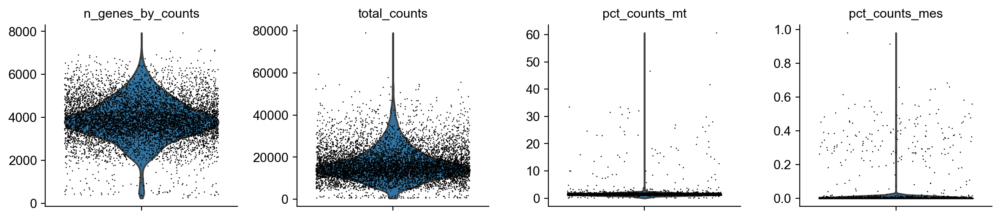

In [5]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_mes'],
             jitter=0.4, multi_panel=True)

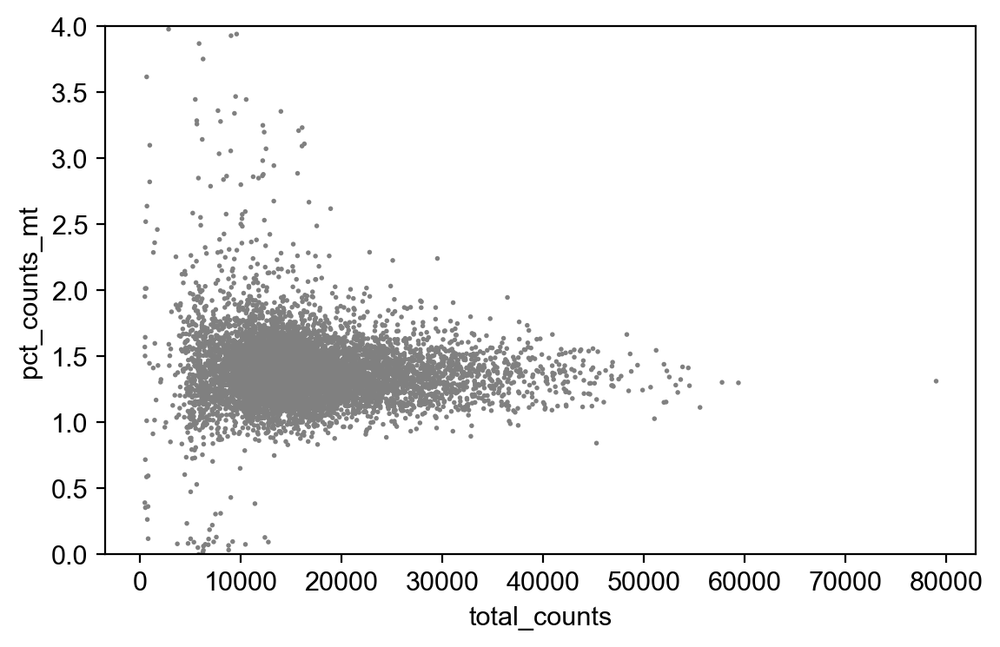

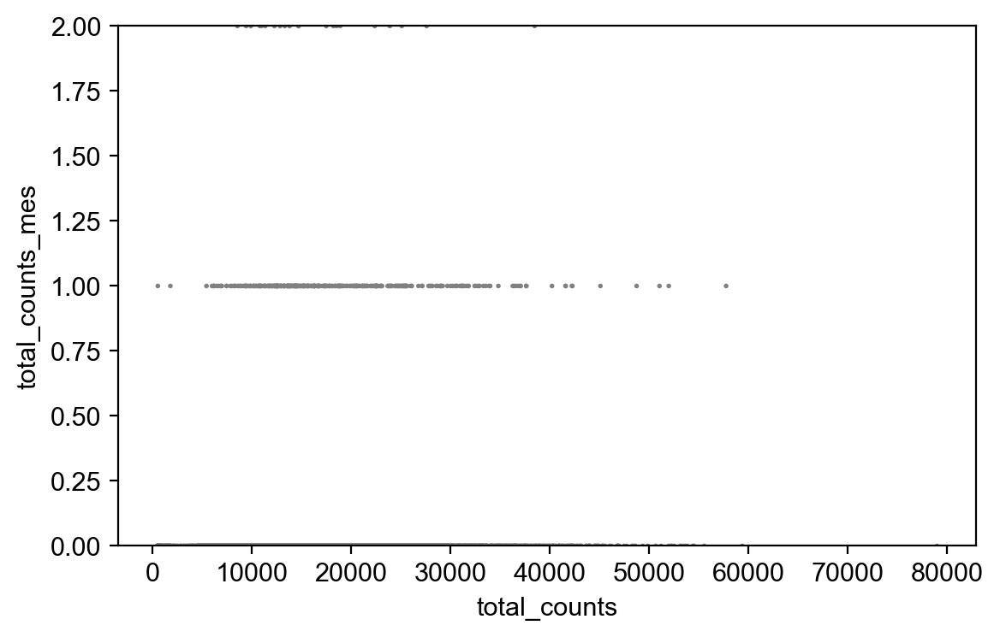

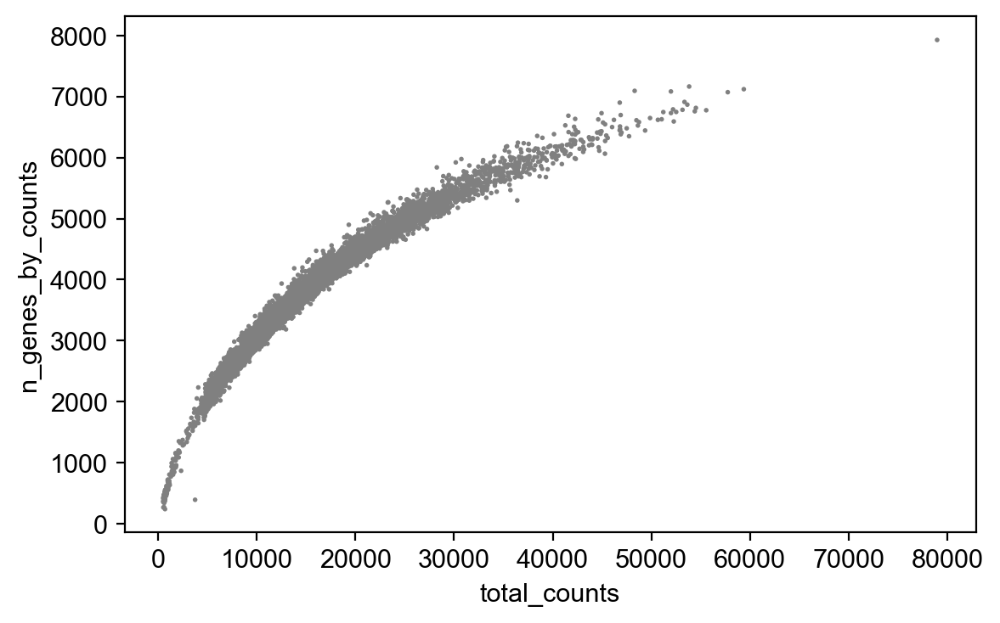

In [6]:
ax = sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', show=False)
ax.set_ylim([0,4])

ax = sc.pl.scatter(adata, x='total_counts', y='total_counts_mes', show=False)
ax.set_ylim([0,2])

sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [7]:
# Keep cells with n_genes_by_counts between 1800 and 7000
adata = adata[adata.obs.n_genes_by_counts > 1800, :]
adata = adata[adata.obs.n_genes_by_counts < 7000, :]
# Keep cells with mt percentage within (.6, 3)
adata = adata[adata.obs.pct_counts_mt > .6, :]
adata = adata[adata.obs.pct_counts_mt < 3, :]

# In combination, the cell number drops from 7686 to 7492
adata

View of AnnData object with n_obs × n_vars = 7492 × 20935
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_mes', 'pct_counts_mes', 'total_counts_Cdh1', 'pct_counts_Cdh1', 'total_counts_Snai2', 'pct_counts_Snai2', 'total_counts_Col4a1', 'pct_counts_Col4a1', 'total_counts_Col4a2', 'pct_counts_Col4a2', 'total_counts_Krt14', 'pct_counts_Krt14'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mes', 'Cdh1', 'Snai2', 'Col4a1', 'Col4a2', 'Krt14'

In [8]:
# Filter out cells that are likely mesenchymal cell contamination
adata = adata[adata.obs.total_counts_mes == 0, :]

# The cell number drops from 7492 to 6943 (549 cells filtered out)
adata

View of AnnData object with n_obs × n_vars = 6943 × 20935
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_mes', 'pct_counts_mes', 'total_counts_Cdh1', 'pct_counts_Cdh1', 'total_counts_Snai2', 'pct_counts_Snai2', 'total_counts_Col4a1', 'pct_counts_Col4a1', 'total_counts_Col4a2', 'pct_counts_Col4a2', 'total_counts_Krt14', 'pct_counts_Krt14'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mes', 'Cdh1', 'Snai2', 'Col4a1', 'Col4a2', 'Krt14'

In [9]:
# The scatter plot turns out to be not useful due to the sparse nature of the data
# sc.pl.scatter(adata, x='pct_counts_Cdh1', y='pct_counts_Snai2', alpha=.05)

# Calculate the pearson correlation coefficient
from scipy.stats import pearsonr
print('Col4a1 and Co4a2: ', pearsonr(adata.obs['pct_counts_Col4a1'], adata.obs['pct_counts_Col4a2']))
print('Col4a1 and Krt14: ', pearsonr(adata.obs['pct_counts_Col4a1'], adata.obs['pct_counts_Krt14']))
print('Cdh1 and Col4a1: ', pearsonr(adata.obs['pct_counts_Cdh1'], adata.obs['pct_counts_Col4a1']))
print('Cdh1 and Krt14: ', pearsonr(adata.obs['pct_counts_Cdh1'], adata.obs['pct_counts_Krt14']))
print('Cdh1 and Snai2: ', pearsonr(adata.obs['pct_counts_Cdh1'], adata.obs['pct_counts_Snai2']))
print('Krt14 and Snai2: ', pearsonr(adata.obs['pct_counts_Krt14'], adata.obs['pct_counts_Snai2']))

Col4a1 and Co4a2:  (0.23086676802423178, 1.155194665491109e-84)
Col4a1 and Krt14:  (0.1513593189928786, 7.362855801928086e-37)
Cdh1 and Col4a1:  (-0.15015950146841928, 2.681664660218722e-36)
Cdh1 and Krt14:  (-0.149980225732603, 3.250015812418059e-36)
Cdh1 and Snai2:  (-0.09785271578522896, 3.0409086904894783e-16)
Krt14 and Snai2:  (0.16331376987884327, 1.048330887659763e-42)


## Preprocessing: normailize data, identify highly variable genes and scale data

In [10]:
# Preprocessing: normalize data
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


extracting highly variable genes
    finished (0:00:01)


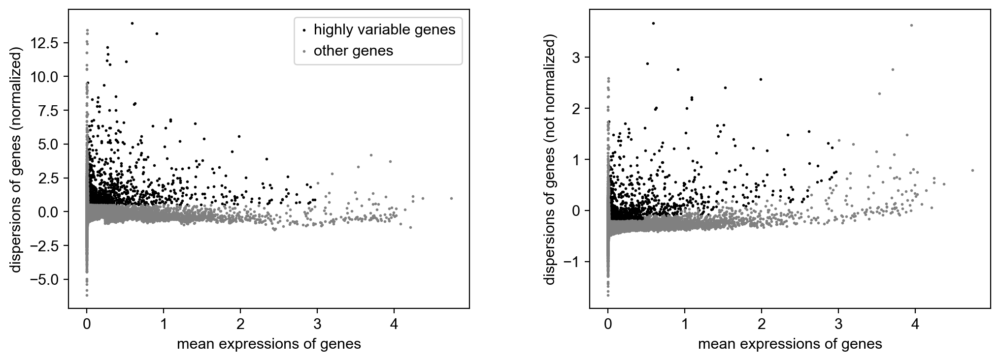

In [11]:
# Preprocessing: identify highly variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)

In [12]:
# Number of highly variable genes detected using the default criteria
print('The number of highly variable genes is:',
      len(adata.var.highly_variable[adata.var.highly_variable == True]))

The number of highly variable genes is: 1341


In [13]:
# Set the .raw attribute of AnnData object to the normalized and
# logarithmized raw gene expression for later use in differential
# testing and visualizations of gene expression.
#
# This simply freezes the state of the AnnData object.

adata.raw = adata

In [14]:
# You can get back an AnnData of the object in .raw by calling .raw.to_adata().

# adata.raw.to_adata()

In [15]:
# Filter to focus on highly variable genes
adata = adata[:, adata.var.highly_variable]

In [16]:
# Regress out effects of total counts per cell and the percentage 
# of mitochondrial genes expressed.

sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:11)


In [17]:
# Scale each gene to unit variance. Clip values exceeding standard deviation 10.
# This is similar to Seurat's "ScaleData"

sc.pp.scale(adata, max_value=10)

## Dimension reduction and UMAP embedding

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


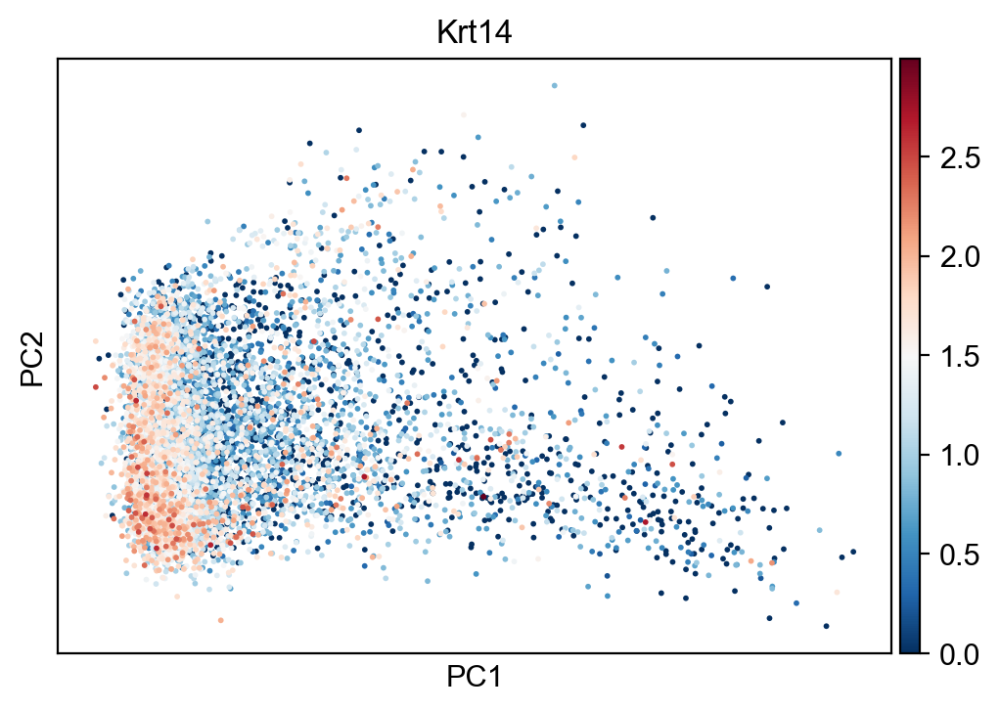

In [18]:
# Reduce the dimensionality of the data by running principal component analysis (PCA), 
# which reveals the main axes of variation and denoises the data.

sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata, color='Krt14')

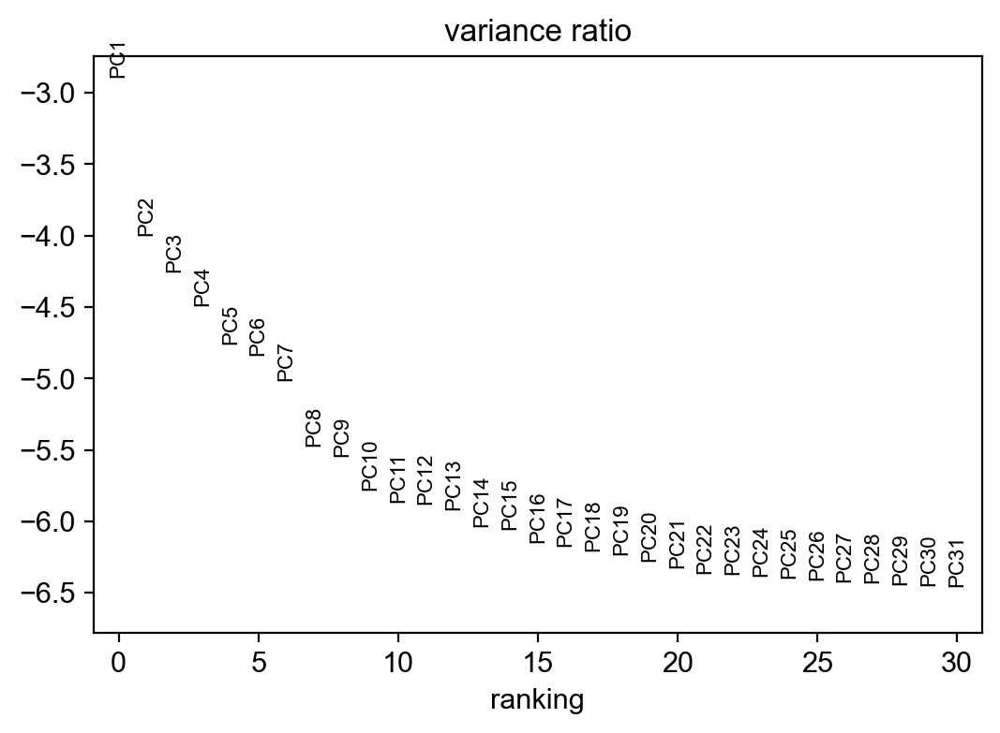

In [19]:
# Inspect the contribution of single PCs to the total variance in the data
# (aka, elbow plot)

sc.pl.pca_variance_ratio(adata, log=True)

In [20]:
# Compute the neighborhood graph of cells using the PCA representation of the data matrix
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=15)

# Compute UMAP embedding
sc.tl.umap(adata)


computing neighbors
    using 'X_pca' with n_pcs = 15
    finished (0:00:04)
computing UMAP
    finished (0:00:12)


running Leiden clustering
    finished (0:00:03)


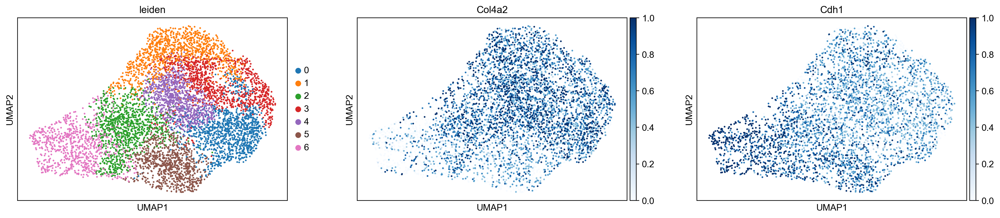

In [21]:
# Clustering the neighborhood graph
sc.tl.leiden(adata, resolution=0.4)

# Visulize a few features in UMAP embedding
sc.pl.umap(adata, color=['leiden', 'Col4a2', 'Cdh1'], vmax=1.0, cmap='Blues')

In [22]:
# # Save the results
adata.write('write/E13epi.h5ad')
# adata

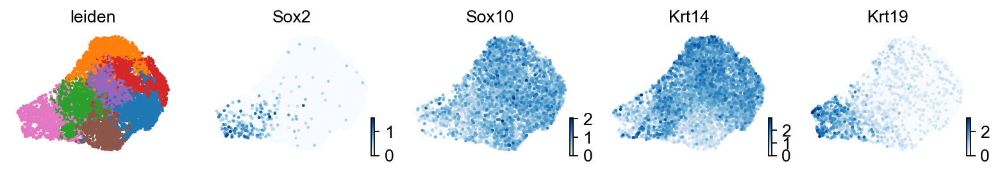

In [23]:
# Visualize marker genes for cluster calling
scv.pl.scatter(adata, basis='umap', color=['leiden', 'Sox2', 'Sox10', 'Krt14', 'Krt19'],
#                figsize=(7.2, 2.8), 
#                size=30,
               color_map='Blues', frameon=False)

In [24]:
new_cluster_names = [
    'Outer bud 1', 'Outer bud 2',
    'Outer duct', 'Outer bud 3',
    'Outer bud 4', 'Inner bud',
    'Inner duct']
adata.rename_categories('leiden', new_cluster_names)

ranking genes
    finished (0:00:15)


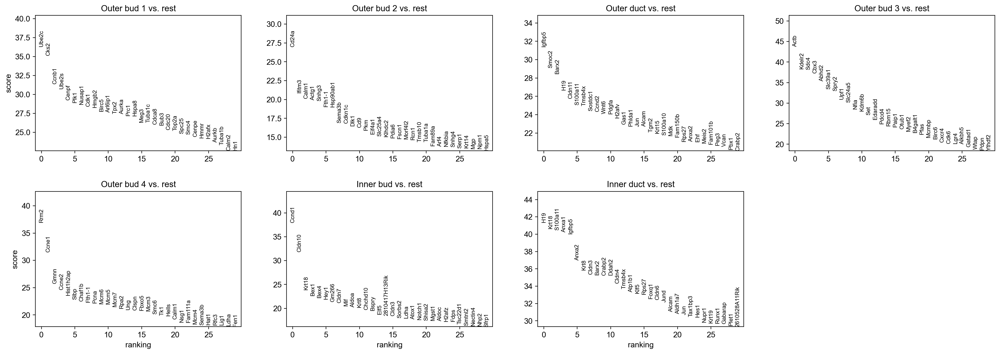

In [25]:
# Compute a ranking for the highly differential genes in each cluster
# using a Wilcoxon rank-sum test
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=30, sharey=False)

In [26]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
groups

('Outer bud 1',
 'Outer bud 2',
 'Outer duct',
 'Outer bud 3',
 'Outer bud 4',
 'Inner bud',
 'Inner duct')

In [27]:
# Get a table with the scores and groups.
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
cluster_genes = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(30)

In [28]:
# Outer_bud_2_genes = cluster_genes['Outer bud 2_n'].tolist()
# Outer_bud_2_genes

In [29]:
top_marker_genes = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)
marker_genes = list(set(top_marker_genes.values.flatten()))
print(len(marker_genes))
marker_genes

64


['Bex1',
 'Bex4',
 'Pcna',
 'Nfia',
 'Igfbp5',
 'Smoc2',
 'Ccnb1',
 'Cenpf',
 'Anxa1',
 'Nusap1',
 'Hsp90ab1',
 'Cldn11',
 'Ube2c',
 'Hist1h2ap',
 'Slc39a1',
 'Plk1',
 'Gm266',
 'Ccne1',
 'Cldn3',
 'Cbx3',
 'H19',
 'Chaf1b',
 'Gmnn',
 'Ube2s',
 'Actg1',
 'Hmgb2',
 'Cdkn1c',
 'Slc24a5',
 'Anxa2',
 'Upf1',
 'Kdelr2',
 'Crabp2',
 'Cks2',
 'S100a11',
 'Cd24a',
 'Snhg3',
 'Slbp',
 'Wnt6',
 'Barx2',
 'Birc5',
 'Calm1',
 'Ccne2',
 'Mif',
 'Sdc4',
 'Fth1-1',
 'Abhd2',
 'Actb',
 'Hey1',
 'Dlk1',
 'Cdk1',
 'Cldn7',
 'Aldoa',
 'Mcm6',
 'Krt18',
 'Rrm2',
 'Ccnd2',
 'Sema3b',
 'Sostdc1',
 'Tmsb4x',
 'Spry2',
 'Krt8',
 'Ccnd1',
 'Cldn10',
 'Ifitm3']

In [30]:
# # Compare to a single cluster.
# # Note that this will replace the default rank_genes_groups values calculated above
# sc.tl.rank_genes_groups(adata, 'leiden', groups=['Outer bud 1', 'Outer bud 2', 'Outer bud 3', 'Outer bud 4'],
#                         reference='Inner bud', method='wilcoxon')
# sc.pl.rank_genes_groups(adata, groups=['Outer bud 1'], n_genes=20)
# sc.pl.rank_genes_groups(adata, groups=['Outer bud 2'], n_genes=20)
# sc.pl.rank_genes_groups(adata, groups=['Outer bud 3'], n_genes=20)
# sc.pl.rank_genes_groups(adata, groups=['Outer bud 4'], n_genes=20)

# # Get a table with the scores and groups.
# result = adata.uns['rank_genes_groups']
# groups = result['names'].dtype.names
# pd.DataFrame(
#     {group + '_' + key[:1]: result[key][group]
#     for group in groups for key in ['names', 'pvals']}).head(30)

In [31]:
# sc.pl.rank_genes_groups_violin(adata, groups='Outer bud 1', n_genes=20)

## Plots for figures

In [32]:
import matplotlib
import matplotlib.pyplot as plt

font = {'family' : 'Arial',
        'size'   : 14}
matplotlib.rc('font', **font)
plt.rcParams['svg.fonttype'] = 'none'

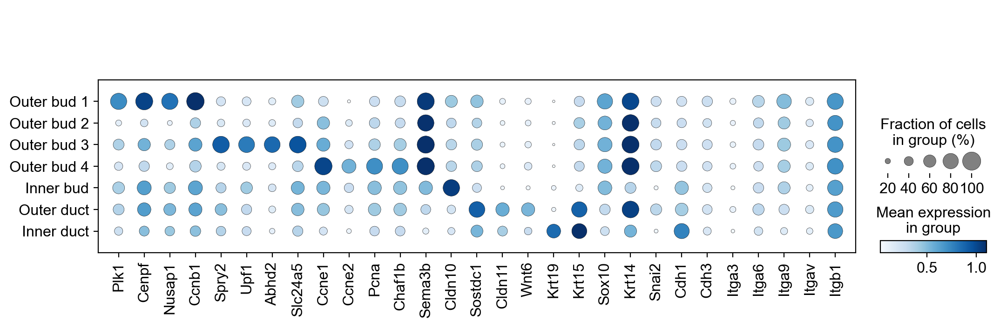

In [33]:
marker_genes = ['Plk1', 'Cenpf','Nusap1', 'Ccnb1', # Outer bud 1
#                 'Smoc2',
                'Spry2', 'Upf1', 'Abhd2', 'Slc24a5', # Outer bud 3
                'Ccne1', 'Ccne2', 'Pcna', 'Chaf1b', # Outer bud 4
                'Sema3b', # Outer buds
                'Cldn10', # Inner bud
#                 'Ccnd1', # Inner bud very high, but also expressed in outer buds
                'Sostdc1', 'Cldn11', 'Wnt6', # Outer duct
                'Krt19', # Inner duct
                'Krt15', # Duct
                'Sox10', # Bud
                'Krt14', 'Snai2', # Outer epithelium
#                 'Krt18', # Inner epithelium
#                 'Col4a1', 'Col4a2',
                'Cdh1', 'Cdh3', # Cadherins
                'Itga3', 'Itga6', 'Itga9', 'Itgav', 'Itgb1' # Integrins
               ]

dotplot = sc.pl.dotplot(adata, marker_genes, groupby='leiden',
#                         figsize=(7, 2),
#                         dendrogram=True,
                        vmax=1.1,
                        categories_order=['Outer bud 1', 'Outer bud 2', 'Outer bud 3', 'Outer bud 4',
                                          'Inner bud', 'Outer duct', 'Inner duct'],
                        return_fig=True)
dotplot.style(cmap='Blues', color_on='dot')
dotplot.savefig('./figures/E13epi_dotplot_Blues.svg')
# dotplot.show()

In [34]:
scv.settings.set_figure_params('scvelo')  # for beautified visualization

saving figure to file ./figures/scvelo_E13epi_scanpy_annotated.svg


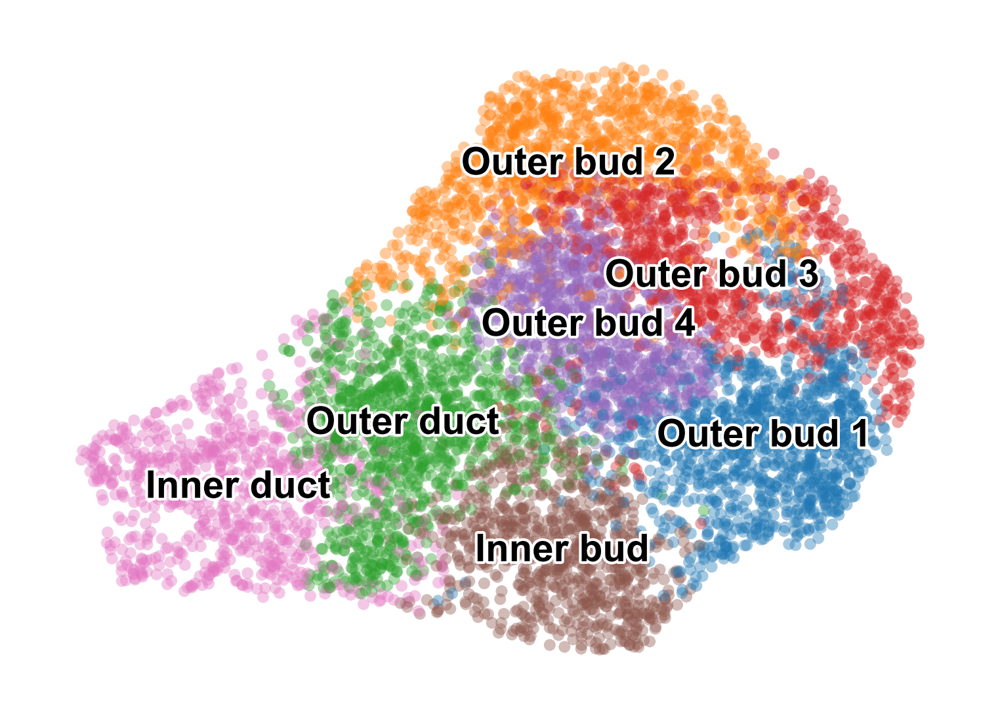

In [35]:
scv.pl.umap(adata, color='leiden', legend_loc='on data', title='',
#             figsize=(2.33, 1.67), 
            figsize=(3.0, 2.14), # defalt is (7, 5)
            dpi=300,
#             fontsize=7,
            legend_fontsize=7,
            alpha=.4,
            frameon=False, save='E13epi_scanpy_annotated.svg')

In [36]:
# cell cycle s genes
df = pd.read_csv('mm_s_genes.txt', header=None)
s_genes = df[0].tolist()

df = pd.read_csv('mm_g2m_genes.txt', header=None)
g2m_genes = df[0].tolist()

# print(s_genes)
# print(g2m_genes)

sc.tl.score_genes_cell_cycle(adata, s_genes, g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished (0:00:00)
computing score 'G2M_score'
    finished (0:00:00)


saving figure to file ./figures/scvelo_E13epi_cell_cycle_phase_CMY.svg


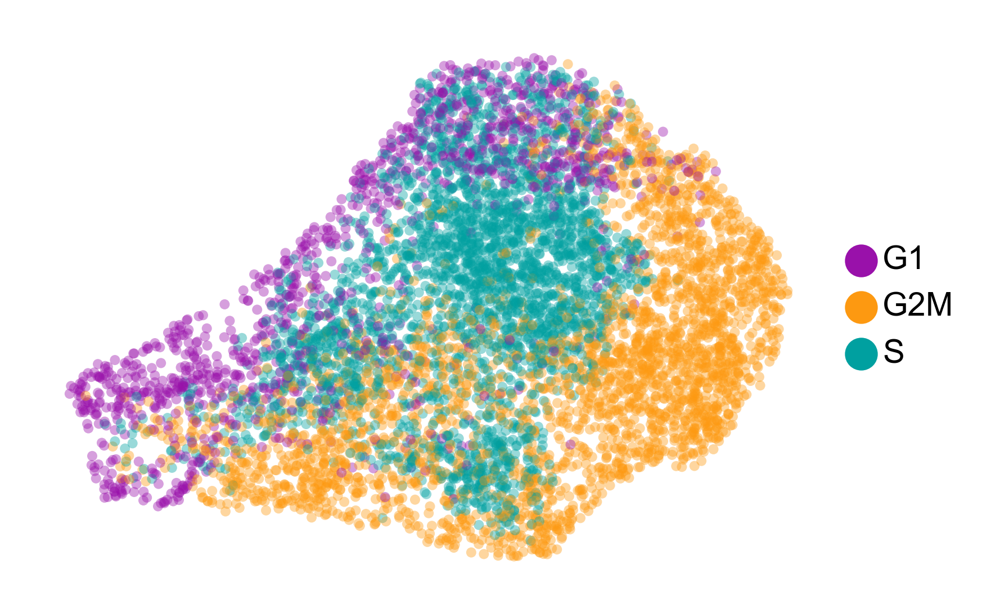

In [37]:
scv.pl.scatter(adata, basis='umap', color='phase', title='',
               figsize=(3.0, 2.14), # defalt is (7, 5)
               dpi=300,
               fontsize=7,
               legend_loc='right margin',
               legend_fontsize=7,
               alpha=.4,
               palette=['#9911aa', '#fd9911', '#00a0a0'],
               frameon=False, save='E13epi_cell_cycle_phase_CMY.svg')

saving figure to file ./figures/scvelo_scatter_plot_Sox10.svg


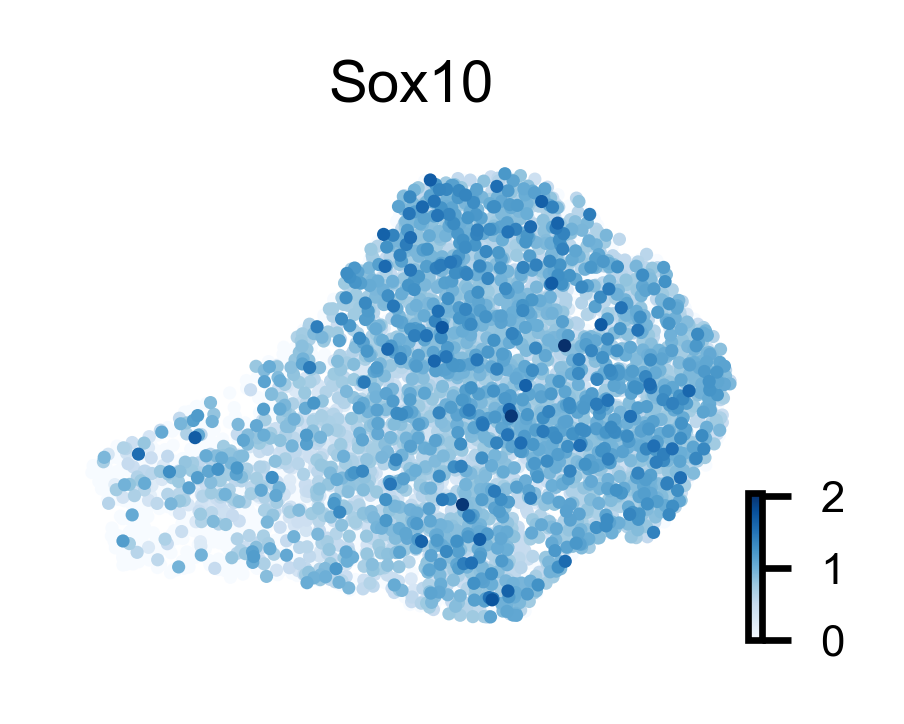

saving figure to file ./figures/scvelo_scatter_plot_Col4a1.svg


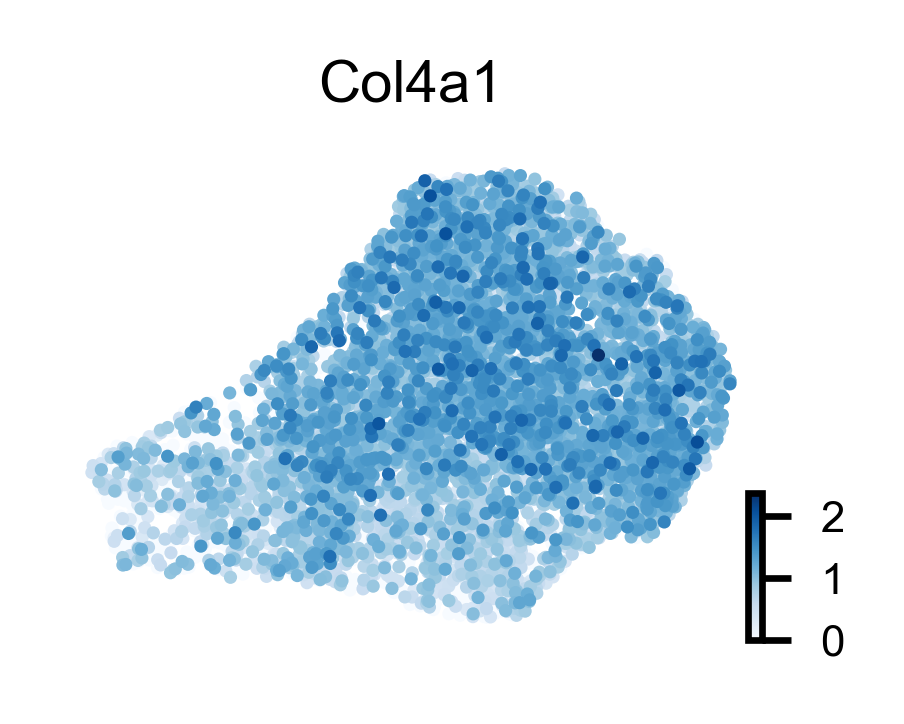

saving figure to file ./figures/scvelo_scatter_plot_Cdh1.svg


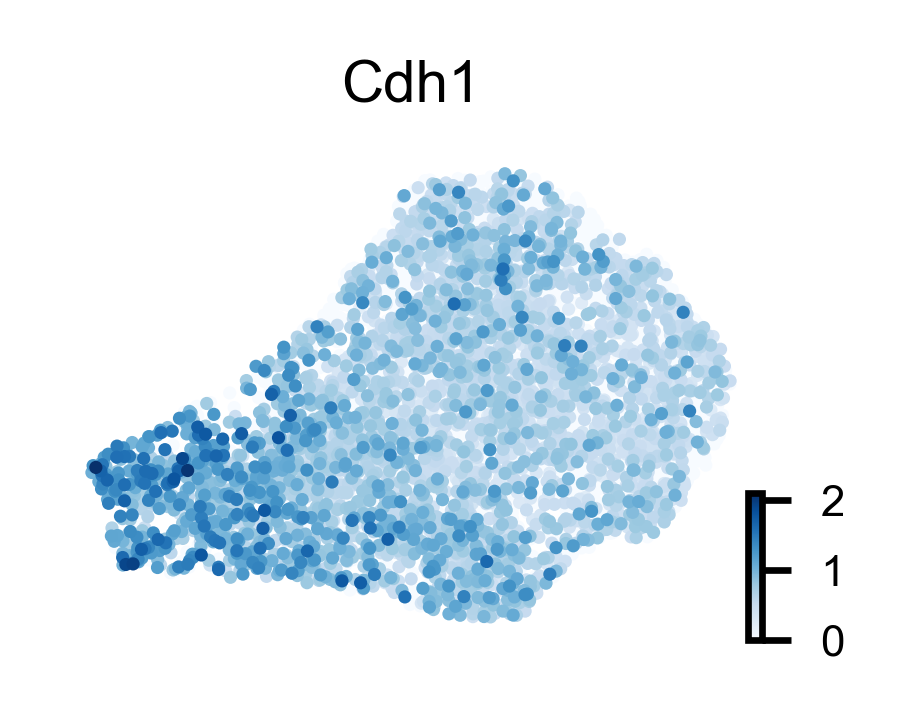

saving figure to file ./figures/scvelo_scatter_plot_Snai2.svg


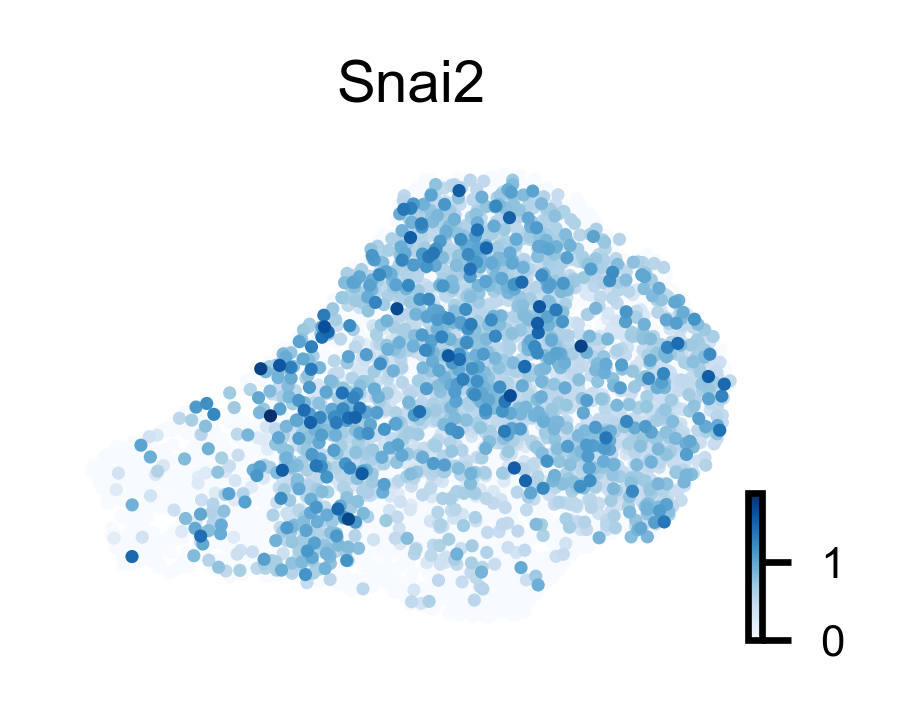

saving figure to file ./figures/scvelo_scatter_plot_Krt14.svg


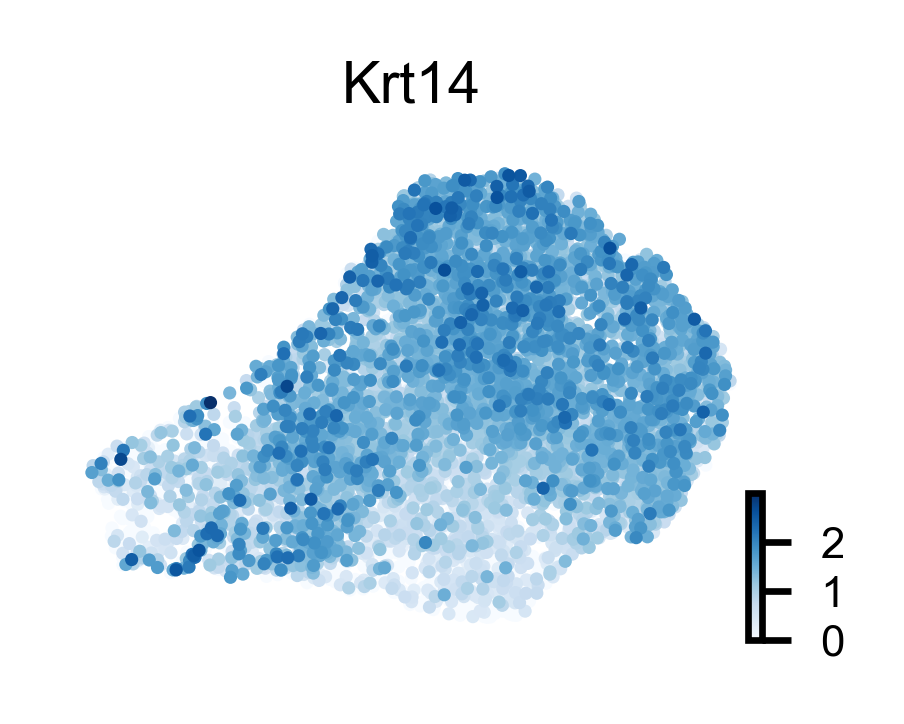

saving figure to file ./figures/scvelo_scatter_plot_Krt15.svg


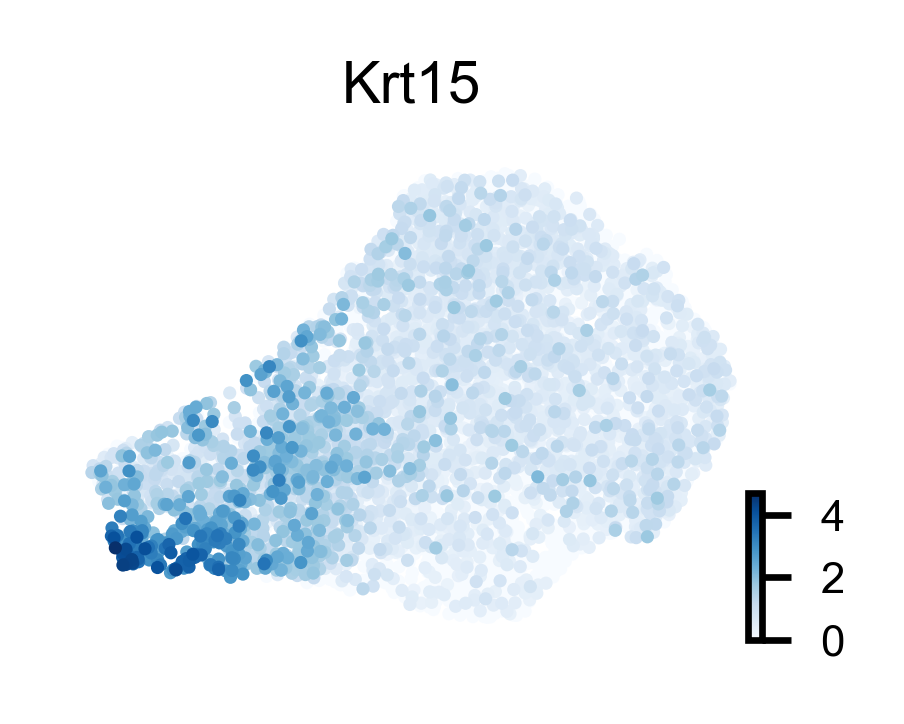

saving figure to file ./figures/scvelo_scatter_plot_Krt19.svg


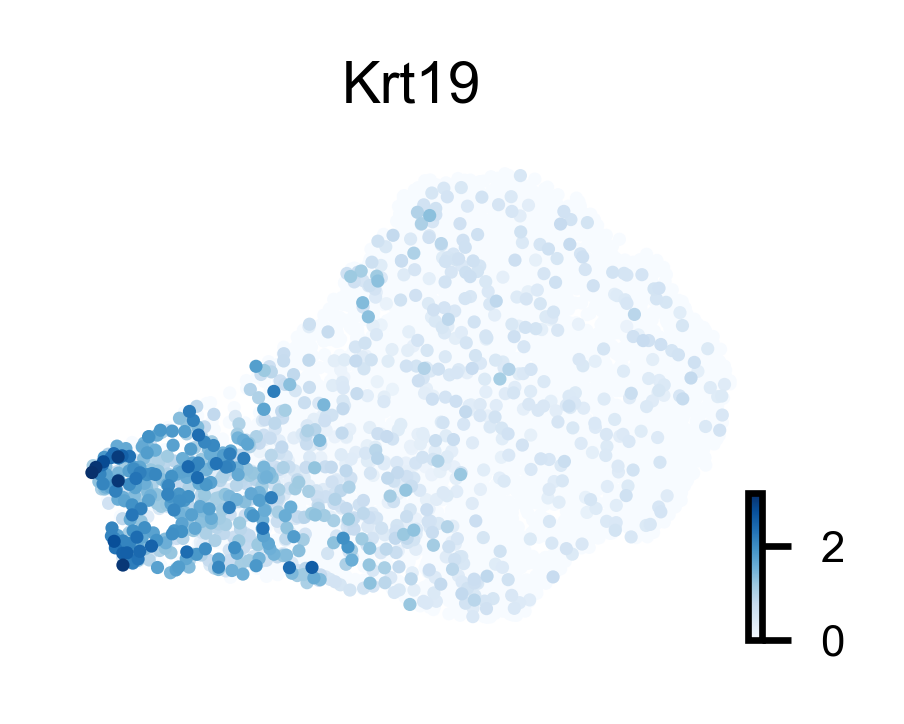

saving figure to file ./figures/scvelo_scatter_plot_Sox2.svg


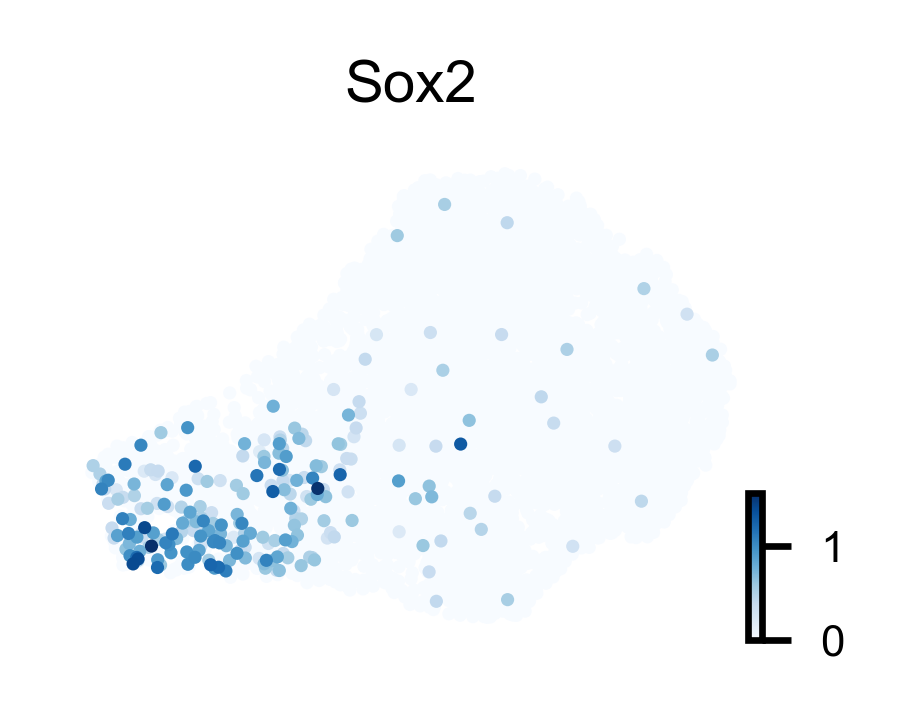

In [38]:
genes = ['Sox10', 'Col4a1', 'Cdh1', 'Snai2',
         'Krt14', 'Krt15', 'Krt19', 'Sox2']
for gene in genes:
    scv.pl.scatter(adata, basis='umap',
                   color=gene,
                   figsize=(1.5, 1.07), # defalt is (7, 5)
                   dpi=300,
                   fontsize=7,
#                    legend_loc='right margin',
                   legend_fontsize=7,
#                    alpha=.5,
                   size=10,
                   save='scatter_plot_'+gene+'.svg',
                   color_map='Blues', frameon=False)

saving figure to file ./figures/scvelo_scatter_plot_Itga3.svg


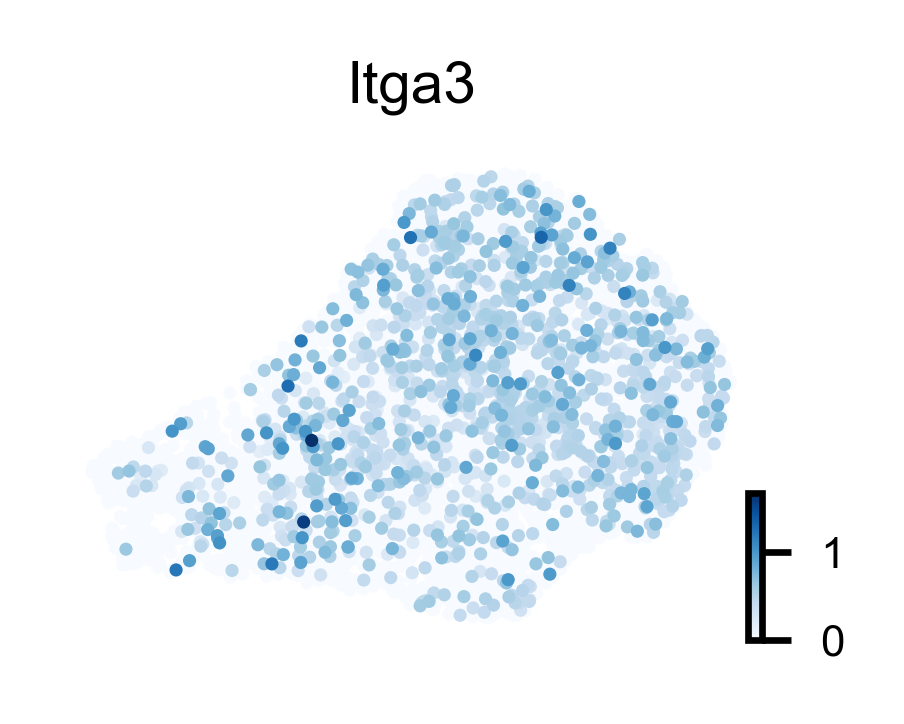

saving figure to file ./figures/scvelo_scatter_plot_Itga6.svg


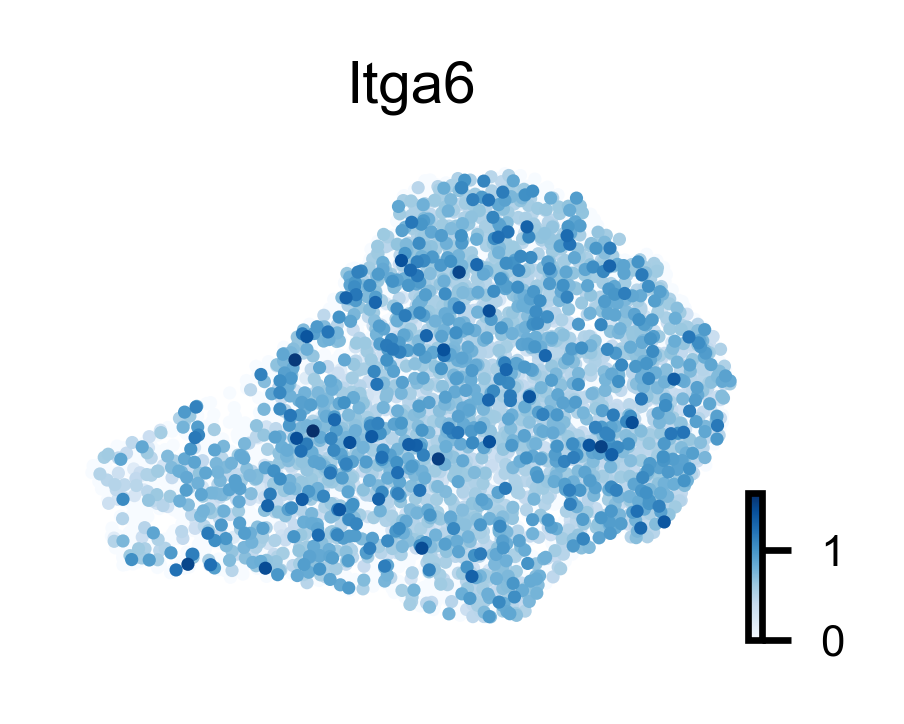

saving figure to file ./figures/scvelo_scatter_plot_Itga9.svg


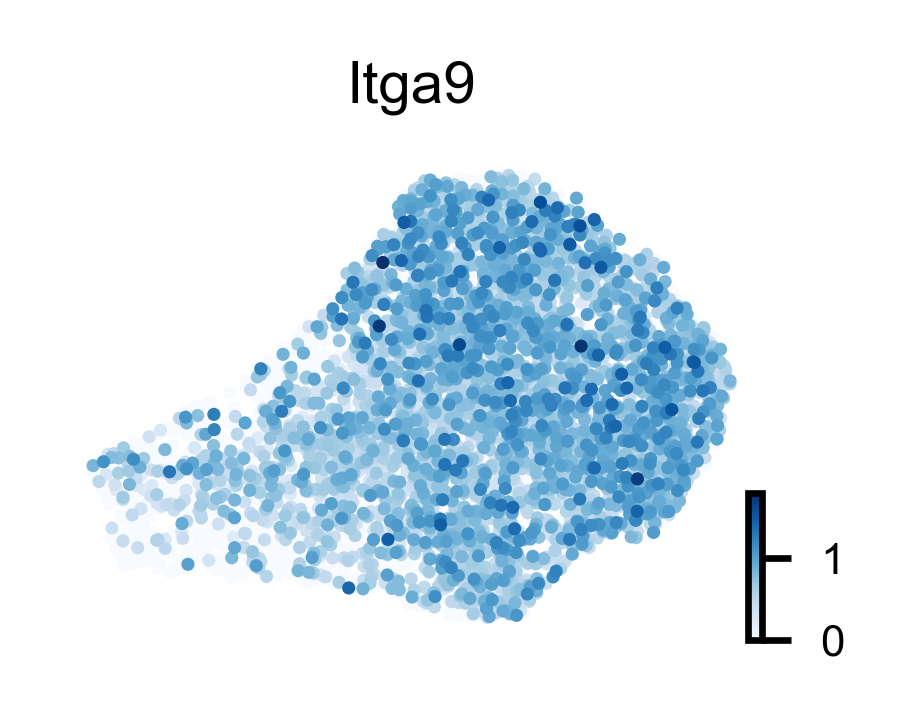

saving figure to file ./figures/scvelo_scatter_plot_Itgav.svg


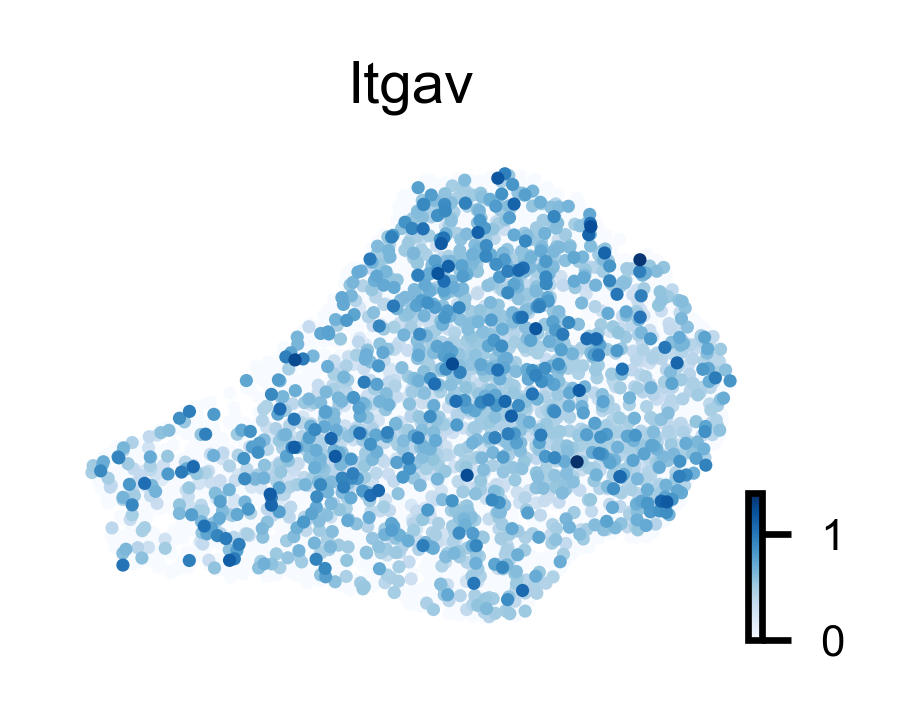

saving figure to file ./figures/scvelo_scatter_plot_Trp63.svg


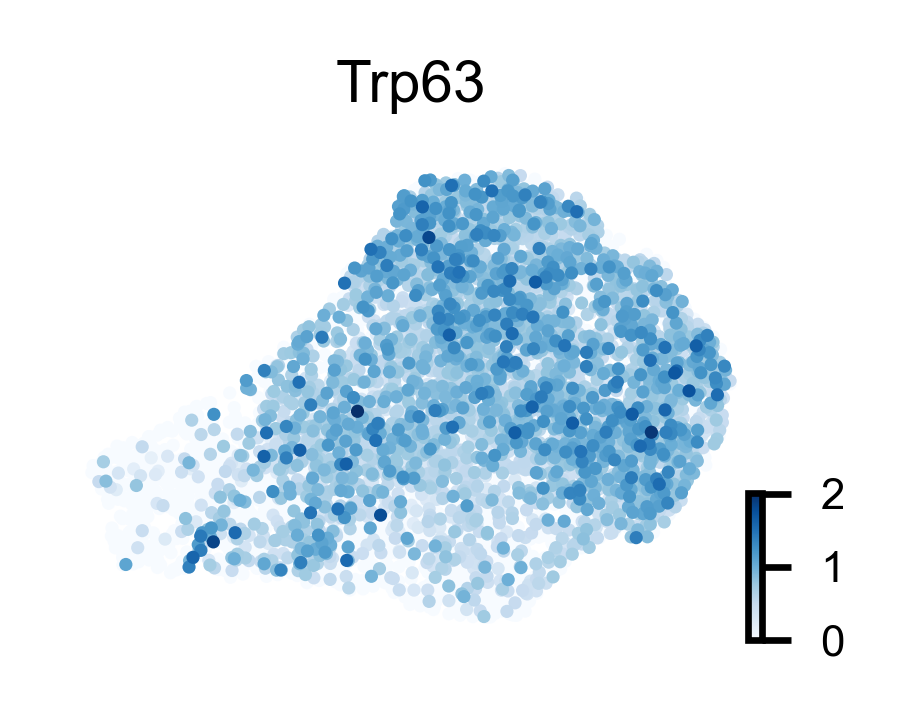

saving figure to file ./figures/scvelo_scatter_plot_Gapdh.svg


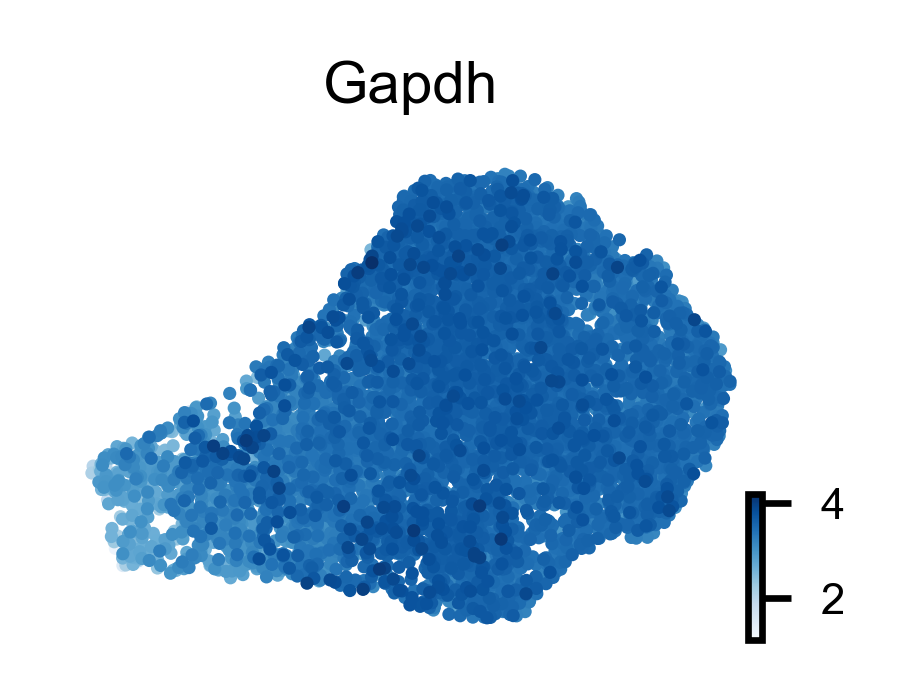

saving figure to file ./figures/scvelo_scatter_plot_Rps29.svg


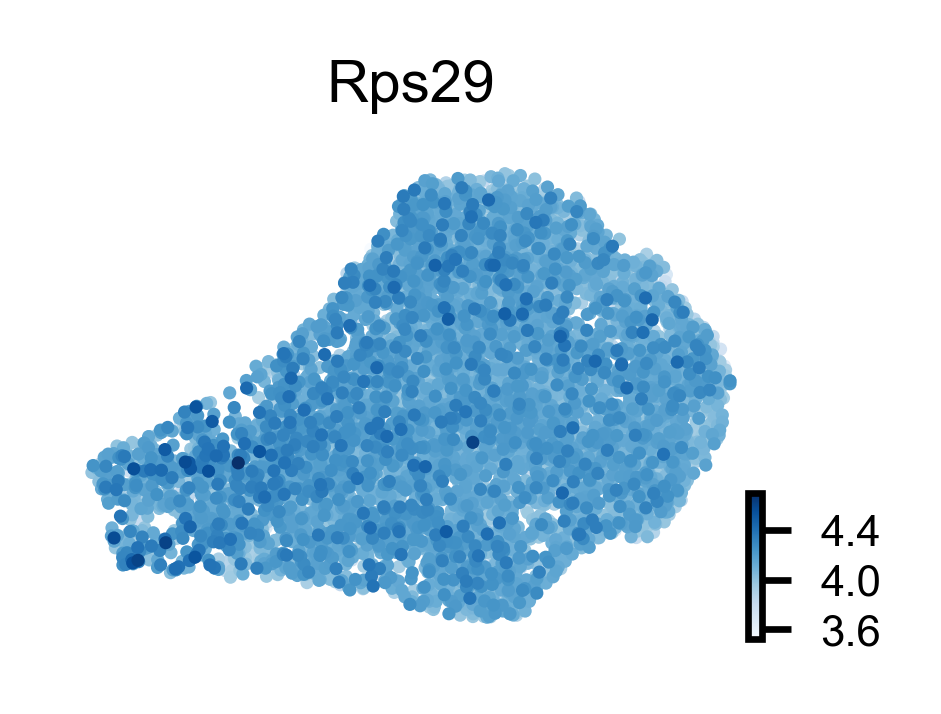

saving figure to file ./figures/scvelo_scatter_plot_Epcam.svg


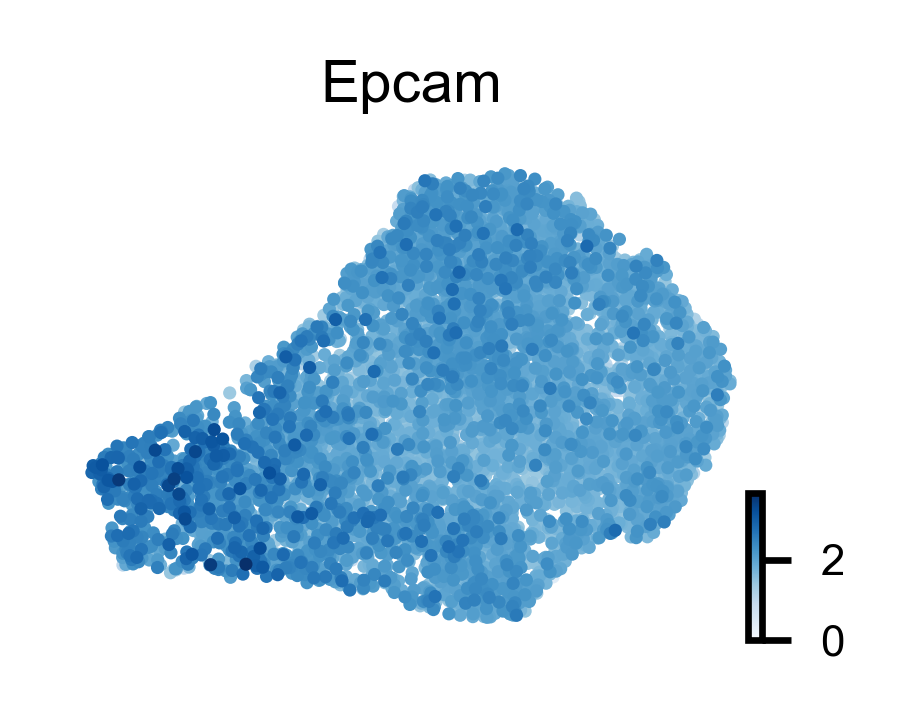

saving figure to file ./figures/scvelo_scatter_plot_Sema3b.svg


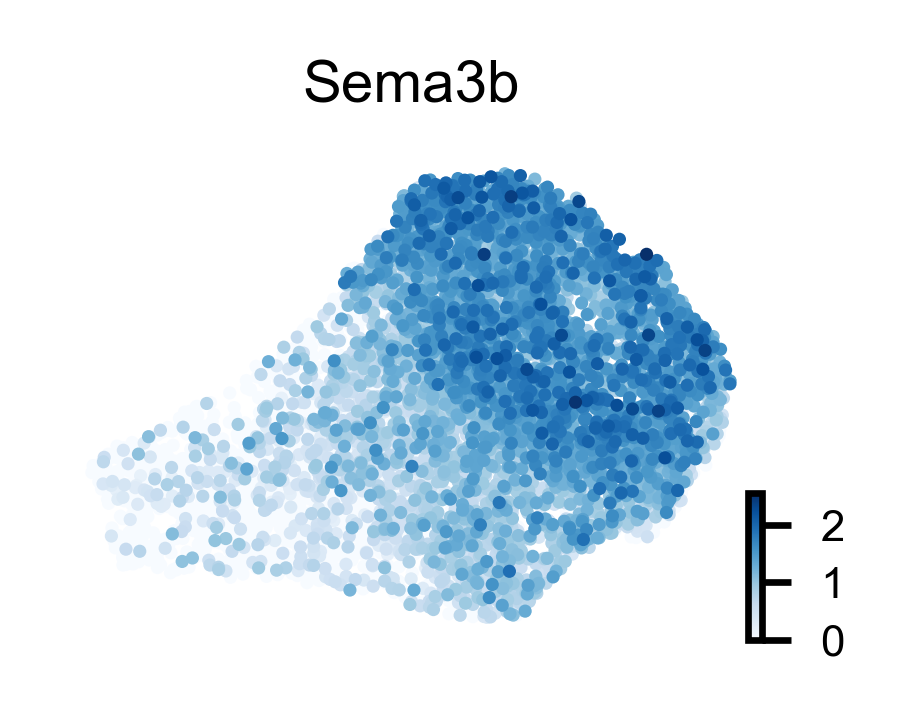

saving figure to file ./figures/scvelo_scatter_plot_Cldn10.svg


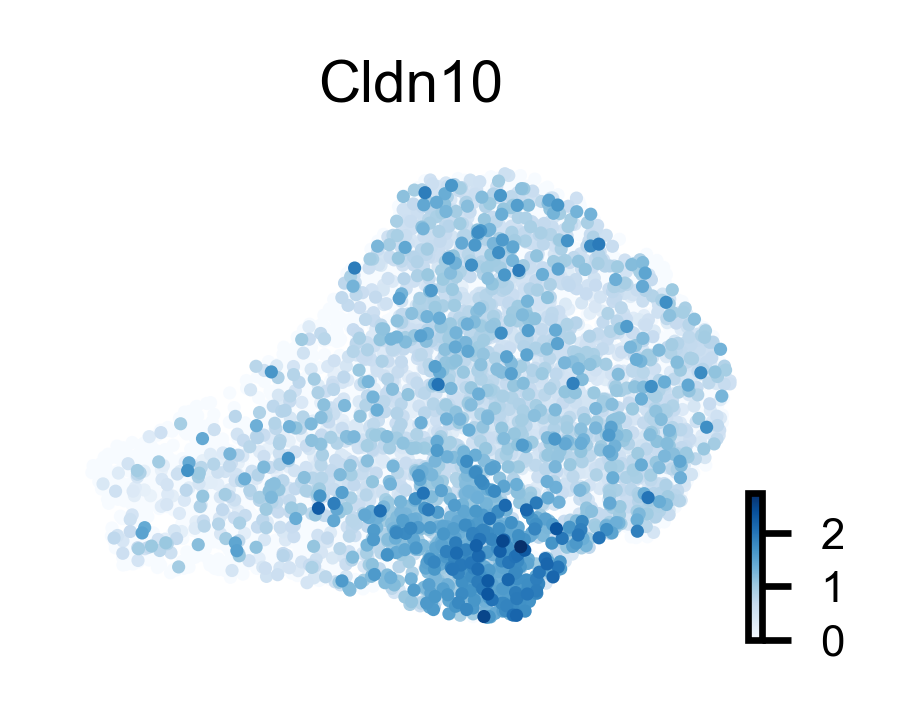

saving figure to file ./figures/scvelo_scatter_plot_Cldn11.svg


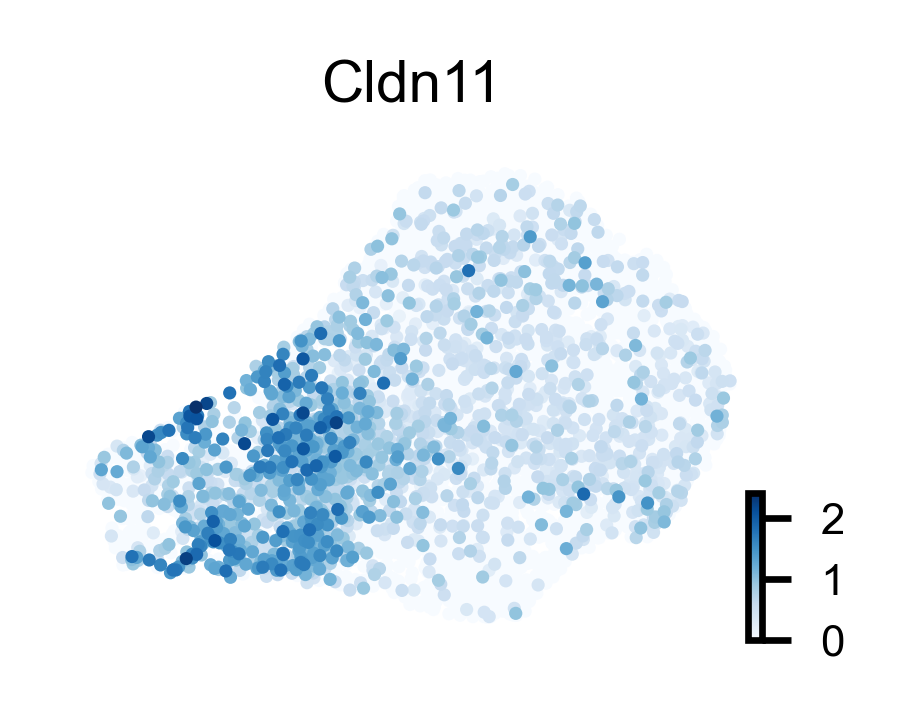

saving figure to file ./figures/scvelo_scatter_plot_Itgb1.svg


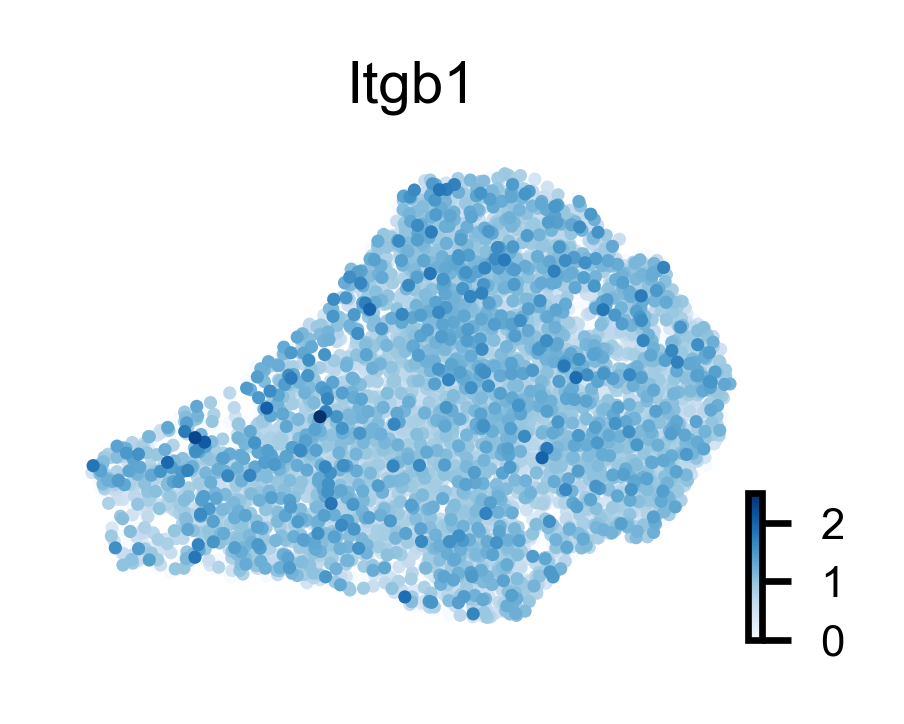

In [39]:
genes = ['Itga3', 'Itga6', 'Itga9', 'Itgav',
         'Trp63', 'Gapdh', 'Rps29', 'Epcam',
         'Sema3b', 'Cldn10', 'Cldn11', 'Itgb1']
# genes = ['Krt18', 'Ccnd1']
for gene in genes:
    scv.pl.scatter(adata, basis='umap',
                   color=gene,
                   figsize=(1.5, 1.07), # defalt is (7, 5)
                   dpi=300,
                   fontsize=7,
#                    legend_loc='right margin',
                   legend_fontsize=7,
#                    alpha=.5,
                   size=10,
                   save='scatter_plot_'+gene+'.svg',
                   color_map='Blues', frameon=False)

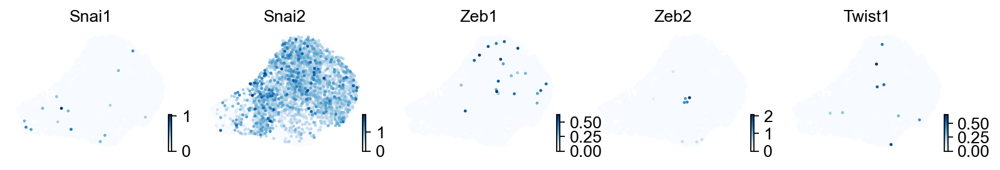

In [40]:
EMTGenes = ['Snai1', 'Snai2', 'Zeb1', 'Zeb2', 'Twist1']
scv.pl.scatter(adata, basis='umap', color=EMTGenes,
#                vmax=2.0,
               ncols=5,
               color_map='Blues', frameon=False)

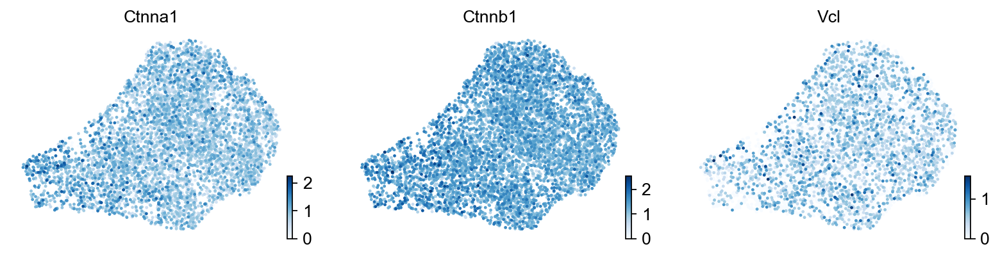

In [41]:
genes = ['Ctnna1', 'Ctnnb1', 'Vcl']
scv.pl.scatter(adata, basis='umap', color=genes,
#                vmax=2.0,
               ncols=5,
               color_map='Blues', frameon=False)

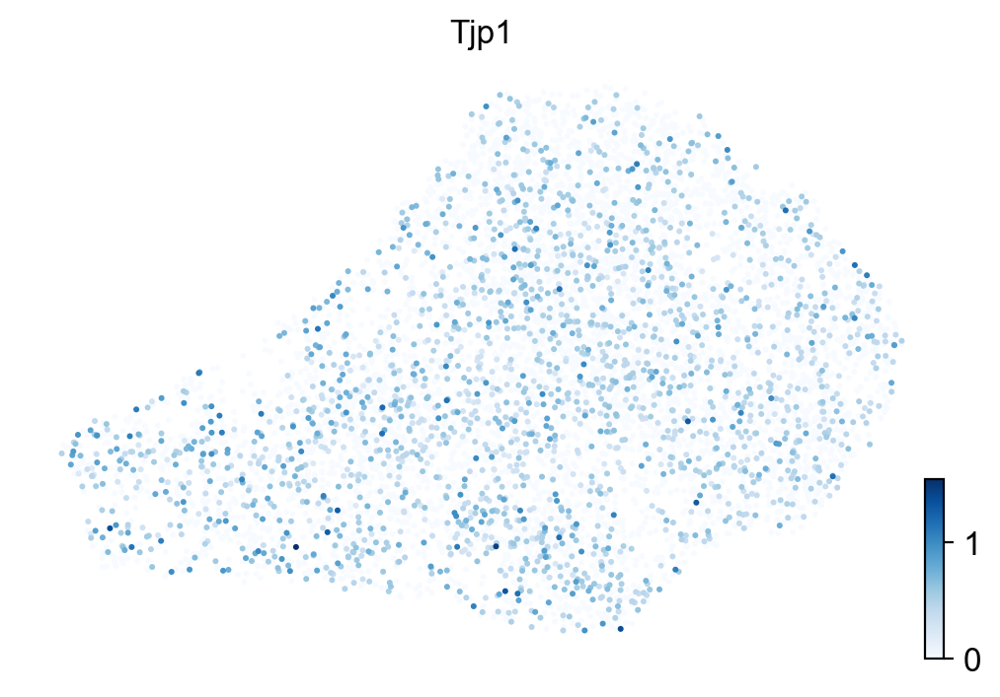

In [59]:
genes = ['Tjp1']
scv.pl.scatter(adata, basis='umap', color=genes,
#                vmax=2.0,
               ncols=5,
               color_map='Blues', frameon=False)

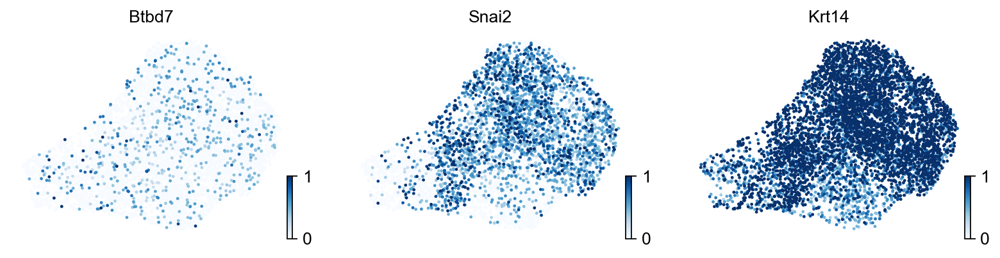

In [56]:
genes = ['Btbd7', 'Snai2', 'Krt14']
scv.pl.scatter(adata, basis='umap', color=genes,
               vmax=1.0,
               ncols=5,
               color_map='Blues', frameon=False)

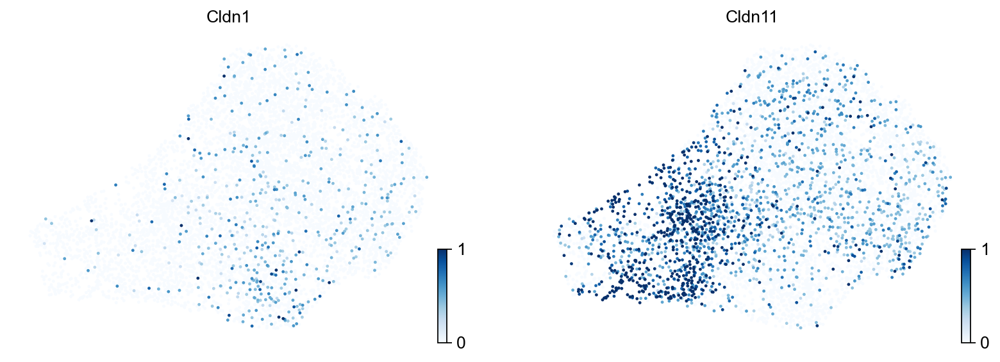

In [61]:
genes = ['Cldn1', 'Cldn11']
scv.pl.scatter(adata, basis='umap', color=genes,
               vmax=1.0,
               ncols=5,
               color_map='Blues', frameon=False)

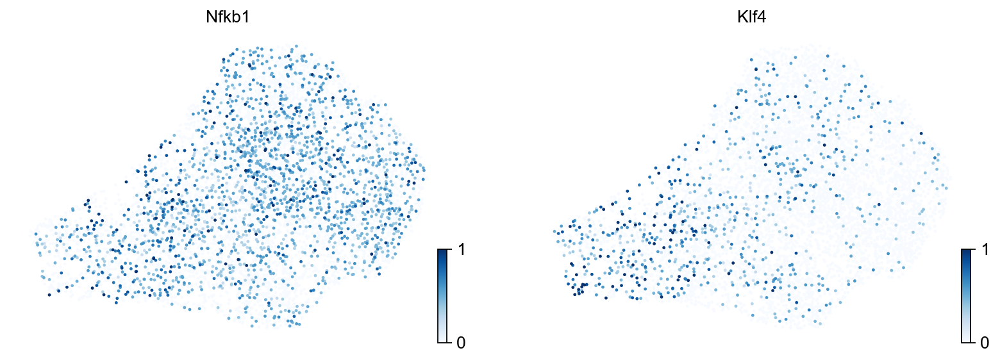

In [63]:
genes = ['Nfkb1', 'Klf4']
scv.pl.scatter(adata, basis='umap', color=genes,
               vmax=1.0,
               ncols=5,
               color_map='Blues', frameon=False)

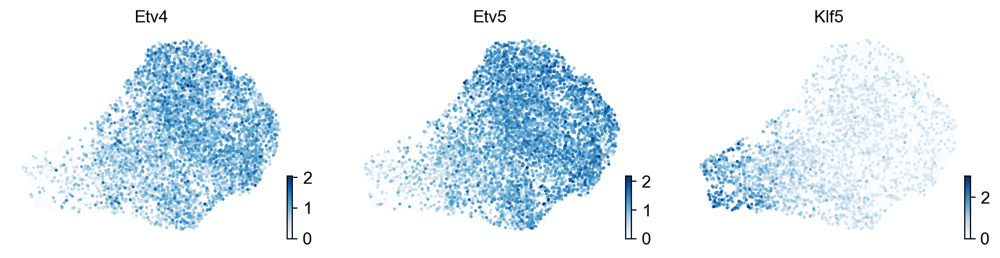

In [58]:
genes = ['Etv4', 'Etv5', 'Klf5']
scv.pl.scatter(adata, basis='umap', color=genes,
#                vmax=1.0,
               ncols=5,
               color_map='Blues', frameon=False)

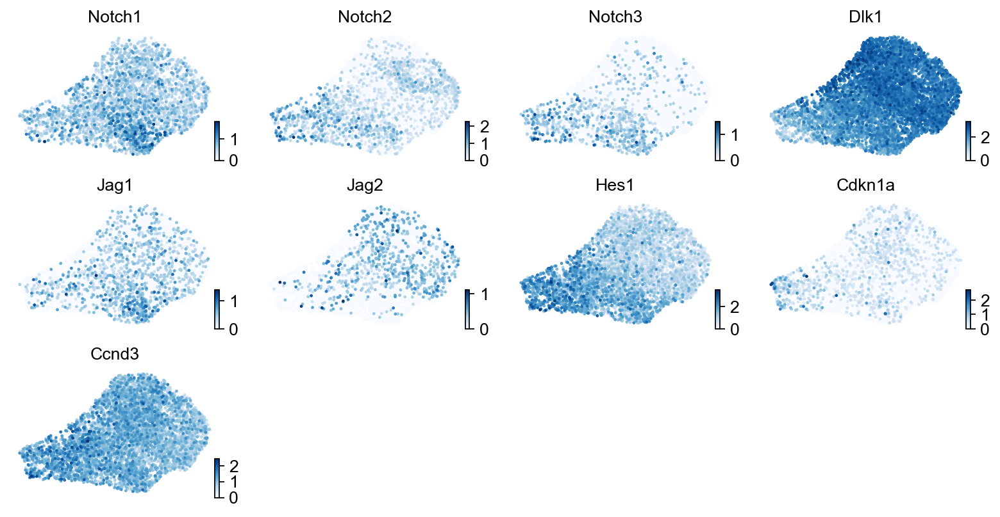

In [42]:
genes = ["Notch1", "Notch2", "Notch3",
         "Dlk1", "Jag1", "Jag2",
         "Hes1", "Cdkn1a", "Ccnd3"]
scv.pl.scatter(adata, basis='umap', color=genes,
#                vmax=2.0,
               ncols=4,
               color_map='Blues', frameon=False)

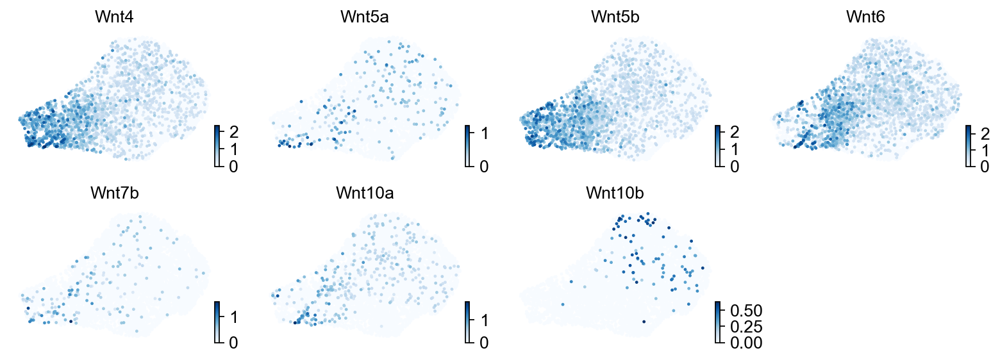

In [43]:
genes = ["Wnt4", "Wnt5a", "Wnt5b", "Wnt6",
         "Wnt7b", "Wnt10a", "Wnt10b"]
scv.pl.scatter(adata, basis='umap', color=genes,
#                vmax=2.0,
               ncols=4,
               color_map='Blues', frameon=False)

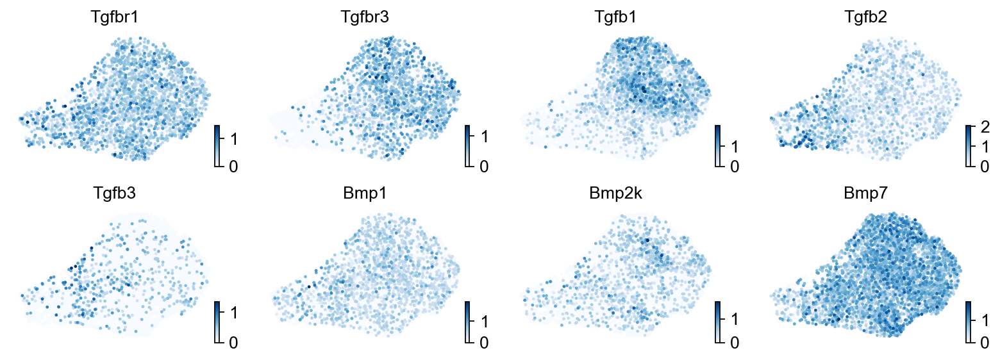

In [44]:
genes = ["Tgfbr1", "Tgfbr3","Tgfb1", "Tgfb2",
         "Tgfb3", "Bmp1", "Bmp2k", "Bmp7"]
scv.pl.scatter(adata, basis='umap', color=genes,
#                vmax=2.0,
               ncols=4,
               color_map='Blues', frameon=False)

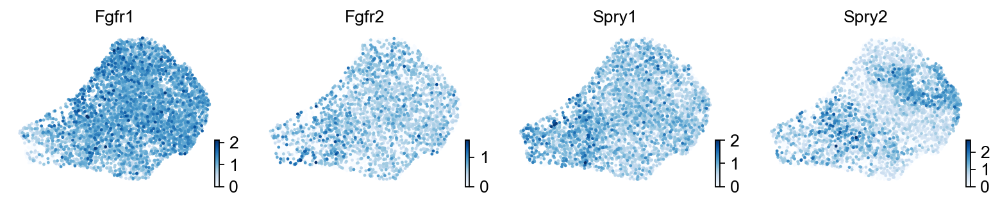

In [45]:
genes = ["Fgfr1", "Fgfr2", "Spry1", "Spry2"]
scv.pl.scatter(adata, basis='umap', color=genes,
#                vmax=2.0,
               ncols=4,
               color_map='Blues', frameon=False)

In [46]:
# Read in velocyto output loom file
velocyto = scv.read('../data/E13epi/E13epi.loom', cache=True)
velocyto.var_names_make_unique

... reading from cache file cache/..-data-E13epi-E13epi.h5ad


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


<bound method AnnData.var_names_make_unique of AnnData object with n_obs × n_vars = 7688 × 28692
    obs: 'Clusters', '_X', '_Y'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'>

In [47]:
E13epi = scv.utils.merge(adata, velocyto)
E13epi

AnnData object with n_obs × n_vars = 6943 × 1282
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_mes', 'pct_counts_mes', 'total_counts_Cdh1', 'pct_counts_Cdh1', 'total_counts_Snai2', 'pct_counts_Snai2', 'total_counts_Col4a1', 'pct_counts_Col4a1', 'total_counts_Col4a2', 'pct_counts_Col4a2', 'total_counts_Krt14', 'pct_counts_Krt14', 'leiden', 'S_score', 'G2M_score', 'phase', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mes', 'Cdh1', 'Snai2', 'Col4a1', 'Col4a2', 'Krt14', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'rank_genes_groups', 'phase_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
 

In [48]:
# show proportions of spliced/unspliced abundances
scv.utils.show_proportions(E13epi)

Abundance of ['spliced', 'unspliced']: [0.89 0.11]


In [49]:
# # Save the results
E13epi.write('write/E13epi_merged_with_velocyto.h5ad')

In [50]:
# Preprocessing for RNA velocity analysis
scv.pp.filter_and_normalize(E13epi, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(E13epi, n_pcs=30, n_neighbors=30)

Filtered out 468 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing neighbors
    finished (0:00:02)
computing moments based on connectivities
    finished (0:00:00)


In [51]:
scv.tl.velocity(E13epi)
scv.tl.velocity_graph(E13epi)

computing velocities
    finished (0:00:01)
computing velocity graph
    finished (0:00:17)


computing velocity embedding
    finished (0:00:02)
saving figure to file ./figures/scvelo_stream_E13epi_0p5.svg


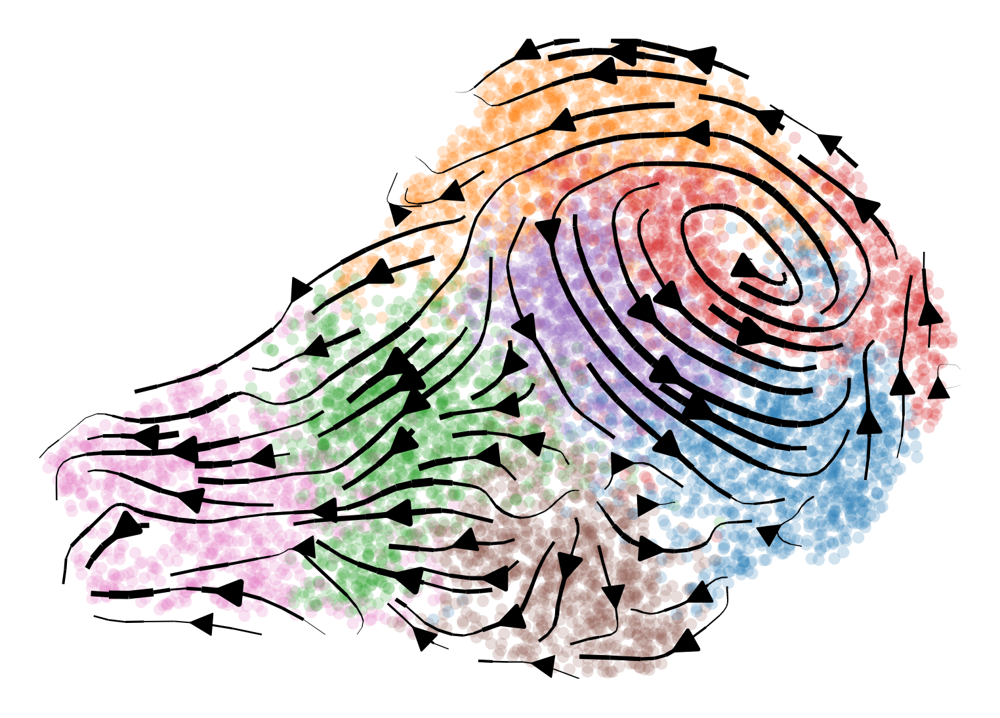

In [52]:
# fig = plt.figure(figsize=(2, 1.5), dpi=300)
# ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])

scv.pl.velocity_embedding_stream(E13epi, basis='umap', color='leiden',
                                 title='', 
                                 figsize=(3.0, 2.14), # defalt is (7, 5)
                                 dpi=300,
                                 fontsize=7,
                                 legend_loc='none',
                                 legend_fontsize=7,
                                 size=20,
                                 alpha=.2,
                                 density=0.5,
                                 save='stream_E13epi_0p5.svg')

# for o in fig.findobj():
#     o.set_clip_on(False)
# for o in ax.findobj():
#     o.set_clip_on(False)

# plt.axis("off")

# plt.savefig('figures/scv_stream_E13epi.svg')
